In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import cKDTree as KDTree
from tqdm import tqdm

## Load Data

In [2]:
# Load taglist
tagList_df =pd.DataFrame(['3110035E14Rik','6330403K07Rik','Adgrl2','Aldoc','Arpp21','Atp1b1','Bcl11b','Cadps2','Calb1','Calb2','Calm2','Cck','Cdh13','Chodl','Chrm2','Cnr1','Col25a1','Cort','Cox6a2','Cplx2','Cpne5','Crh','Crhbp','Cryab','Crym','Cux2','Cxcl14','Enc1','Enpp2','Fam19a1','Fos','Fxyd6','Gabrd','Gad1','Gap43','Gda','Grin3a','Hapln1','Htr3a','Id2','Kcnk2','Kctd12','Kit','Lamp5','Lhx6','Ndnf','Neurod6','Nos1','Nov','Npy','Npy2r','Nr4a2','Nrn1','Nrsn1','Ntng1','Pax6','Pcp4','Pde1a','Penk','Plcxd2','Plp1','Pnoc','Prkca','Pthlh','Pvalb','Pvrl3','Qrfpr','Rab3c','Rasgrf2','Rbp4','Reln','Rgs10','Rgs12','Rgs4','Rorb','Rprm','Satb1','Scg2','Sema3c','Serpini1','Slc17a8','Slc24a2','Slc6a1','Snca','Sncg','Sst','Sulf2','Synpr','Tac1','Tac2','Th','Thsd7a','Tmsb10','Trp53i11','Vip','Vsnl1','Wfs1','Yjefn3','Zcchc12'], columns=['Gene'])
tagList_df.shape

(99, 1)

In [3]:
# Load spot coordinates
barcodes_df = pd.read_csv("../data/ISS_Qian_et_al/right-spots.csv", sep = ",", names=['Gene', 'global_Y_pos', 'global_X_pos', 'Q', 'parentCell'],header=0)   
barcodes_df.shape

(42448, 5)

In [4]:
barcodes_df.head()

,Gene,global_Y_pos,global_X_pos,Q,parentCell
0,Pvalb,14941,22835,0.985970,3135
1,Cplx2,14884,22843,0.953968,3135
2,3110035E14Rik,14976,22845,0.991564,3135
3,Lamp5,14985,22847,0.959152,3135
4,Nov,14979,22848,0.984943,3135


In [5]:
# Auxiliary function to build spatial gene expression graph
def buildGraph(barcodes_df, d_th):
    G = nx.Graph()
    node_removed = []
    barcodes_df.reset_index(drop=True, inplace=True)

    kdT = KDTree(np.array([barcodes_df.global_X_pos.values,barcodes_df.global_Y_pos.values]).T)
    res = kdT.query_pairs(d_th)
    res = [(x[0],x[1]) for x in list(res)]

    # Add nodes
    G.add_nodes_from((barcodes_df.index.values), test=False, val=False, label=0)
    # Add edges
    G.add_edges_from(res)
    
    # Remove connected components with less than N nodes, representing spurious gene expression
    N=3
    for component in tqdm(list(nx.connected_components(G))):
        if len(component)<N:
            for node in component:
                node_removed.append(node)
                G.remove_node(node)

    barcodes_df = barcodes_df[~barcodes_df.index.isin(node_removed)]
    barcodes_df.reset_index(drop=True, inplace=True)
    
    return G, barcodes_df

In [6]:
# Auxiliary function to compute maximum nearest neighbor distance d_th
def plotNeighbor(barcodes_df):
    barcodes_df.reset_index(drop=True, inplace=True)
    
    kdT = KDTree(np.array([barcodes_df.global_X_pos.values,barcodes_df.global_Y_pos.values]).T)
    d,i = kdT.query(np.array([barcodes_df.global_X_pos.values,barcodes_df.global_Y_pos.values]).T,k=2)
    plt.hist(d[:,1],bins=200);
    plt.axvline(x=np.percentile(d[:,1],97),c='r')
    print(np.percentile(d[:,1],97))
    d_th = np.percentile(d[:,1],97)
    
    return d_th

#### Estimate maximum nearest neighbor distance for connecting spots in spatial gene expression graph

25.612496949731394


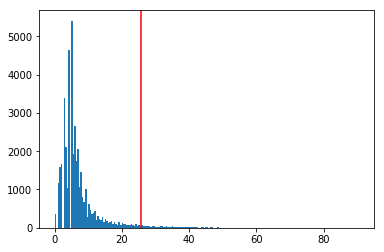

In [7]:
d_th = plotNeighbor(barcodes_df)

#### Generate spatial gene expression graph

In [8]:
G, barcodes_df = buildGraph(barcodes_df, d_th)

100%|██████████| 2350/2350 [00:00<00:00, 677151.31it/s]


In [9]:
# Number of nodes in the graph
print(G.number_of_nodes())

40483


In [10]:
barcodes_df.shape

(40483, 5)

## Load Embedding

In [11]:
X = np.load('../results/ISS_Qian_et_al/embedding_ISS_right.npy')
X.shape

(40483, 50)

## Visualization of node embeddings

In [13]:
import umap

reducer = umap.UMAP(
    n_neighbors=10,
    n_components=3,
    n_epochs=500,
    init='spectral',
    min_dist=0.1,
    spread=1,
    random_state=42
)
embedding = reducer.fit_transform(X)

/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/p

In [14]:
Y_umap = embedding
Y_umap -= np.min(Y_umap, axis=0)
Y_umap /= np.max(Y_umap, axis=0)
Y_umap.shape

(40483, 3)

In [15]:
c_umap = Y_umap

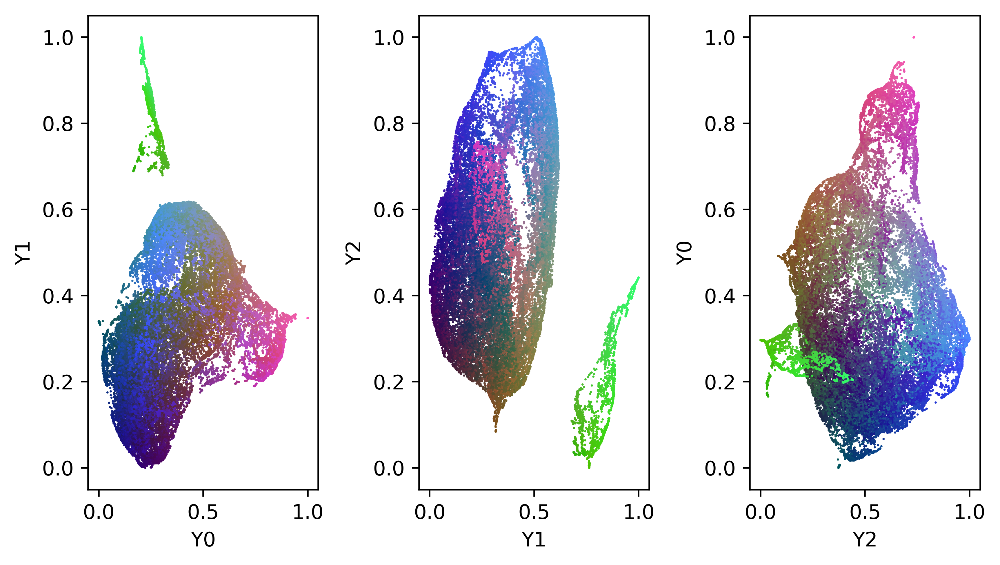

In [14]:
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(7,4),dpi=500)
cycled = [0,1,2,0]
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(Y_umap[:,cycled[i]], Y_umap[:,cycled[i+1]], c=Y_umap,  s=5, marker='.', linewidths=0, edgecolors=None)
    plt.xlabel("Y"+str(cycled[i]))
    plt.ylabel("Y"+str(cycled[i+1]))
plt.tight_layout()
# plt.savefig('./figures/SupFig1b.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

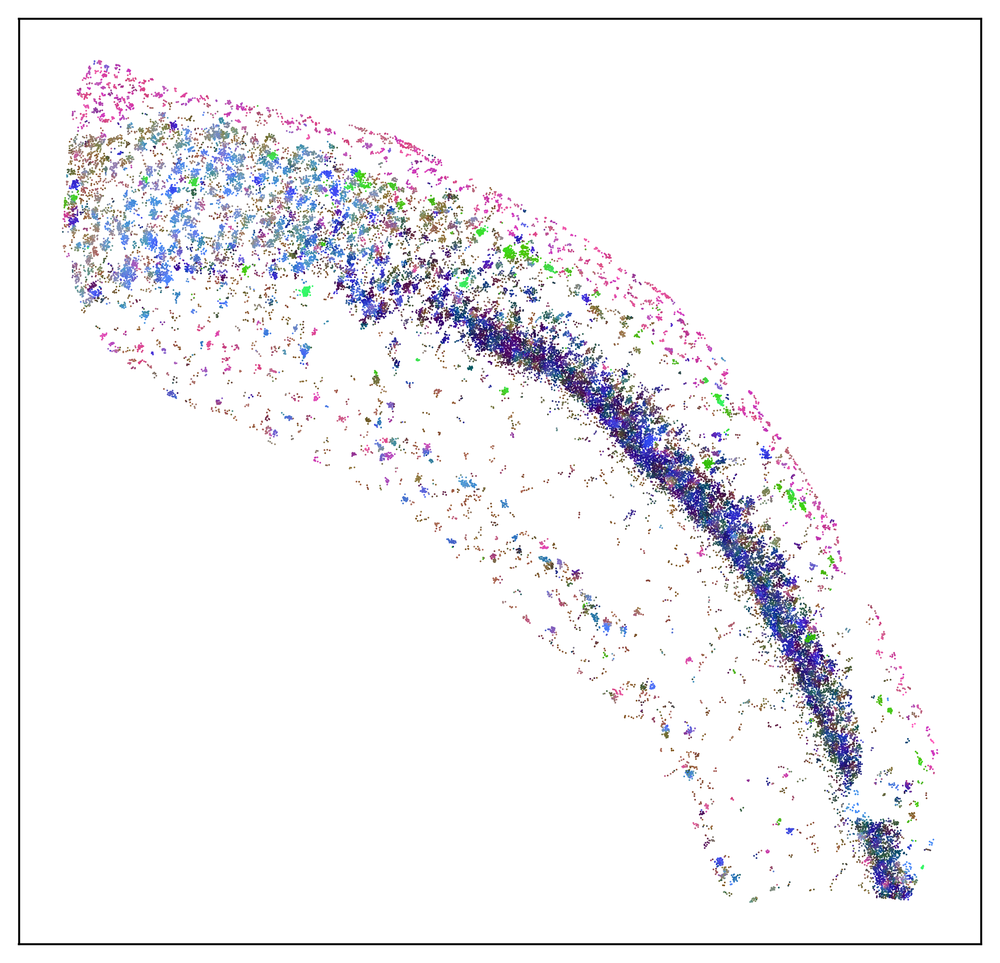

In [15]:
fig=plt.figure(figsize=(7,7),dpi=500)
plt.scatter(barcodes_df.global_X_pos, barcodes_df.global_Y_pos, c=Y_umap, s=2,marker='.',linewidths=0, edgecolors=None)
plt.axis('scaled');
plt.xticks([])
plt.yticks([])
# plt.savefig('../figures/SupFig1a.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

## Identification of distinct gene constellations and spatial domains

#### Clustering of the embedding space with Scanpy [1] implementation of Leiden clustering  algortihm

[1] ***Wolf, F. Alexander, Philipp Angerer, and Fabian J. Theis. "SCANPY: large-scale single-cell gene expression data analysis." Genome biology 19.1 (2018): 15.***

In [16]:
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = '../results/ISS_Qian_et_al/ISS_4_1_right.h5'  # the file that will store the analysis results

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.24.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [17]:
adata = sc.AnnData(X=X)

In [ ]:
# Compute the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=15)

In [ ]:
# Run Leiden clustering algorithm
sc.tl.leiden(adata, random_state = 42)

In [ ]:
adata.obs['Gene'] = barcodes_df.Gene.values

In [ ]:
# save clustering data
adata.write(results_file)

In [18]:
# Load clustering data
adata = sc.read(results_file)

In [19]:
# Extract leiden clusters
col_cluster = adata.obs['leiden'].values.astype(int)
col = np.unique(col_cluster)

In [20]:
# Add leiden clusters to spots dataframe
barcodes_df['cluster'] = adata.obs['leiden'].values
go_clusters = np.unique(adata.obs['leiden'].values)
barcodes_df.head()

,Gene,global_Y_pos,global_X_pos,Q,parentCell,cluster
0,Pvalb,14941,22835,0.985970,3135,13
1,Cplx2,14884,22843,0.953968,3135,14
2,3110035E14Rik,14976,22845,0.991564,3135,4
3,Lamp5,14985,22847,0.959152,3135,4
4,Nov,14979,22848,0.984943,3135,4


## Compare with Qian et al. [2] cell-type map
[2] ***Qian, Xiaoyan, et al. "Probabilistic cell typing enables fine mapping of closely related cell types in situ." Nature methods (2019): 1-6.***

In [21]:
# Auxiliary function for plotting heatmap
def heat_map(df, labels, sort=None, cluster_colors=None, 
             cluster_number = False, save=False, name='', fontsz=8):
    """
    Plot heat_map of a dataframe.
    Input:
    `df`(pandas dataframe): Dataframe to plot. Cells as columns, genes as rows.
    `labels`(list/array): list of labels of the cells in the same order as the 
        df columns.
    `sort`(list): List of sorted cluster numbers. If None it will plot them in
        assending order
    `cluster_colors`(dict): Dictionary matching cluster numbers with colors
        in the hex fomat. Like '#ff0000' for red
    `cluster_number`(bool): Show cluster numbers in the top color bar. Usefull
        when manually sorting the clusters.
    `save`(bool): option to save the figure as png with 300dpi.
    `name`(str): Name to use when saving
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('df used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    cl, lc = gen_labels(df, np.array(labels))[:2]
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = sum([lc[i] for i in optimal_order], [])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = [cl[i] for i in optimal_sort_cells]
    
    fig, axHM = plt.subplots(figsize=(20,10))
    
    df_full = df.copy()
    z = df_full.values
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells]
    
    
    im = axHM.pcolormesh(z.values, cmap='viridis')
    
    plt.yticks(np.arange(0.5, len(df.index), 1), z.index, fontsize=fontsz)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    plt.xticks(np.arange(0.5,df.shape[1],step=1), labels=z.columns, rotation='vertical', fontsize=fontsz)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)
    
    counter = Counter(labels)
    pos=0
    if cluster_colors == None:
        optimal_sort_labels = np.array(optimal_sort_labels)
        axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='nipy_spectral')
        if cluster_number==True:
            for l in optimal_order:
                axLabel.text(pos + (counter[l]/2), 1.2, l, fontsize=fontsz,
                         horizontalalignment='center', verticalalignment='center')
                pos += Counter(labels)[l]
        
    else:
        for l in optimal_order:
            #Use Bottom instead of y for older versions of matplotlib
            axLabel.barh(y = 0, left = pos, width = counter[l], color=cluster_colors[l],
                        linewidth=0.5, edgecolor=cluster_colors[l])
            if cluster_number==True:
                axLabel.text(pos + (counter[l]/2), 0, l, fontsize=fontsz,
                         horizontalalignment='center', verticalalignment='center')
            pos += Counter(labels)[l]
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
#     if save == True:
#         plt.savefig('../figures/{}.svg'.format(name), dpi=500)
    

In [22]:
# Auxiliary functions for merging clusters
def post_merge(df, labels, post_merge_cutoff, linkage_method='single', 
               linkage_metric='correlation', fcluster_criterion='distance', name='', save=False):
    """
    Merge clusters based on likage and a cutoff. The mean expression levels of 
    the clusters are linked and them merged based on the cutoff provided.
    Input:
    `df`(Pandas dataframe): df with expression matrix. row-genes, col-cells.
    `labels`(list/array): Labels of the cells.
    `post_merge_cutoff`(float): Merge clusters that have a distance from each 
        other below the cutoff.
    `linkage_method`(string): Scipy linkage methods. Default = 'single'
    `linkage_metric`(string): Scipy lingae metric. Default = 'correlation'
    `fcluster_criterion`(string): Scipy fcluster criterion. Default = 'distance'

    Returns:
    `new_labels`(list): List of new cell labels after merging. 
    Additionally it plots the dendrogram showing which clusters are merged.

    """
    Z = scipy.cluster.hierarchy.linkage(df.T, method=linkage_method, metric=linkage_metric)
    merged_labels_short = scipy.cluster.hierarchy.fcluster(Z, post_merge_cutoff, criterion=fcluster_criterion)

    #Update labels  
    label_conversion = dict(zip(df.columns, merged_labels_short))
    label_conversion_r = dict(zip(merged_labels_short, df.columns))
    new_labels = [label_conversion[i] for i in labels] 

    #Plot the dendrogram to visualize the merging
    fig, ax = plt.subplots(figsize=(20,10))
    scipy.cluster.hierarchy.dendrogram(Z, labels=df.columns ,color_threshold=post_merge_cutoff)
    ax.hlines(post_merge_cutoff, 0, ax.get_xlim()[1])
    ax.set_title('Merged clusters')
    ax.set_ylabel(linkage_metric, fontsize=20)
    ax.set_xlabel('pre-merge cluster labels', fontsize=20)
    ax.tick_params(labelsize=10)
    
#     if save == True:
#         fig.savefig('../figures/{}.svg'.format(name), dpi=500)

    return new_labels

def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to 
    get the names of colums and rows)
    `model`(obj OR array): Clustering object. OR numpy array with cell labels.
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a

In [23]:
# Load pciSeq cell-type data
pciSeq_ct = pd.read_csv('../data/ISS_Qian_et_al/right-classnames.csv')
pciSeq_cells = pd.read_csv('../data/ISS_Qian_et_al/right-cells.csv', header=0, names=pciSeq_ct.values.T[0].tolist()+['X','Y'])

#### Merge cluster based on correlation distance

In [24]:
# Create cluster gene expression matrix
hm = barcodes_df.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm.shape

(98, 29)

In [25]:
# Add Vsnl1 gene with zero expression
hm = hm.append(pd.DataFrame(np.zeros((tagList_df[~tagList_df.Gene.isin(hm.index.values)].values.reshape(-1).shape[0],hm.shape[1])), index=tagList_df[~tagList_df.Gene.isin(hm.index.values)].values.reshape(-1), columns=hm.columns)).sort_index()

In [26]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm = pd.DataFrame(scaler.fit_transform(hm.values), columns=hm.columns, index=hm.index)
hm.head()

cluster,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
3110035E14Rik,3.362963,0.844930,3.035533,3.844958,2.224242,3.900787,5.668726,2.186756,2.953174,4.928778,...,-0.051249,0.160138,0.319511,1.955699,2.344976,-0.036296,0.024393,4.080285,2.234365,-0.236212
6330403K07Rik,-0.195707,0.092191,-0.239719,-0.272512,-0.296086,-0.333885,-0.215353,-0.250179,0.051160,-0.264759,...,-0.112011,-0.142798,-0.211369,-0.352740,-0.445168,-0.068962,-0.277470,-0.238424,0.373569,-0.236212
Adgrl2,-0.271023,-0.190085,-0.186026,-0.088147,-0.149980,-0.116102,-0.293808,-0.250179,-0.167860,-0.203897,...,-0.142392,-0.183189,-0.432569,-0.401856,-0.445168,-0.199625,-0.176849,0.059418,-0.324230,-0.236212
Aldoc,0.030240,2.933778,-0.275514,-0.129117,-0.113453,-0.309687,-0.274194,-0.133018,0.981995,0.262710,...,0.024704,-0.062015,-0.211369,0.089301,2.662038,-0.199625,0.024393,0.506181,0.528635,-0.236212
Arpp21,-0.120391,0.111010,0.189823,0.505916,0.050916,0.150077,0.020010,0.288759,0.297557,0.222135,...,-0.142392,-0.102406,0.054071,0.089301,0.569430,-0.199625,-0.076228,1.250786,-0.169163,-0.236212


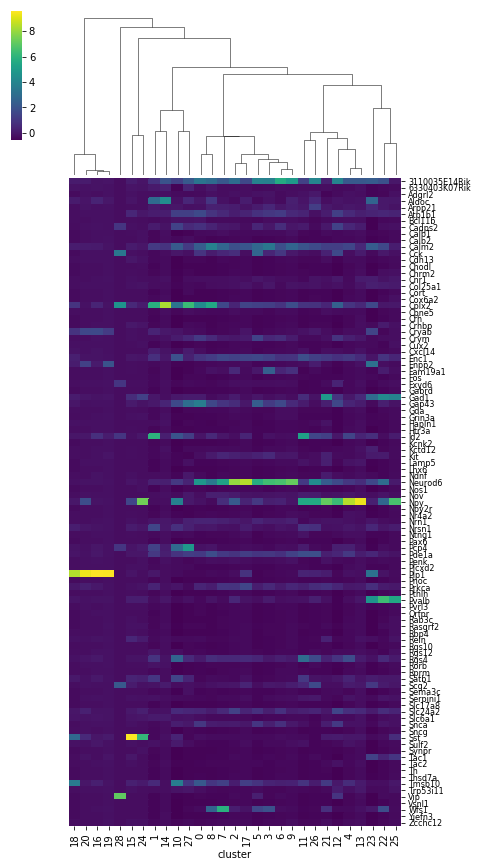

In [27]:
# Plot hierarchical clustering based on correlation
import seaborn as sns
g = sns.clustermap(hm, row_cluster=False, metric='correlation', method='average', cmap='viridis', figsize=(7,15), xticklabels=True, yticklabels=True)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_ymajorticklabels(), fontsize = 8)
# g.savefig("../figures/SupFig3.svg", dpi=500, bbox_inches='tight', pad_inches=0.0)

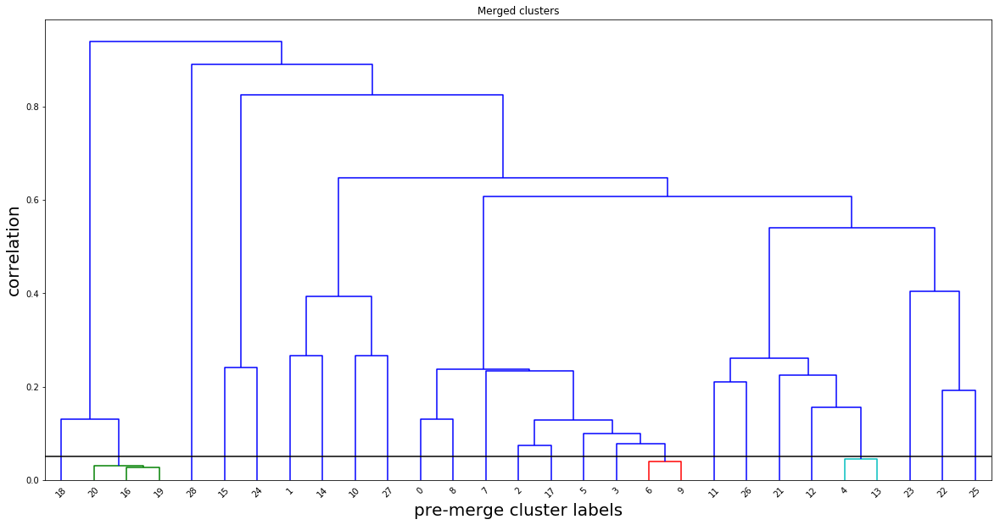

In [28]:
# Merge high correlated clusters
import scipy
hm_merge = post_merge(hm, hm.columns, 0.05, linkage_metric='correlation', linkage_method='average', name='SupFig3Dend', save=True)

In [29]:
# Macroclusters
np.unique(hm_merge)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25], dtype=int32)

In [30]:
# Create cluster gene expression matrix
hm = barcodes_df.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm.head()

cluster,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
Gene,,,,,,,,,,,,,,,,,,,,,
3110035E14Rik,204,68,192,210,143,182,309,112,126,261,...,7,18,17,49,46,6,7,61,35,0
6330403K07Rik,15,28,9,9,5,7,9,8,20,5,...,3,3,5,2,2,5,1,3,11,0
Adgrl2,11,13,12,18,13,16,5,8,12,8,...,1,1,0,1,2,1,3,7,2,0
Aldoc,27,179,7,16,15,8,6,13,54,31,...,12,7,5,11,51,1,7,13,13,0
Arpp21,19,29,33,47,24,27,21,31,29,29,...,1,5,11,11,18,1,5,23,4,0


In [31]:
# Add Vsnl1 gene with zero expression
hm = hm.append(pd.DataFrame(np.zeros((tagList_df[~tagList_df.Gene.isin(hm.index.values)].values.reshape(-1).shape[0],hm.shape[1])), index=tagList_df[~tagList_df.Gene.isin(hm.index.values)].values.reshape(-1), columns=hm.columns)).sort_index()
hm.shape

(99, 29)

In [32]:
# Compute new cluster gene expression matrix based on macro clusters from merging results
hm_macro = pd.DataFrame(np.zeros((hm.shape[0], np.unique(hm_merge).shape[0])), index=hm.index, columns=np.unique(hm_merge))

for d in np.unique(hm_merge):
    hm_macro.loc[:,d] = hm.iloc[:,np.where(np.array(hm_merge)==d)[0]].sum(axis=1)

In [33]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm_macro = pd.DataFrame(scaler.fit_transform(hm_macro.values), columns=hm_macro.columns, index=hm_macro.index)
hm_macro.head()

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
3110035E14Rik,-0.000057,0.136482,0.190571,-0.036296,0.844930,2.032808,1.344316,2.234365,3.362963,2.953174,...,2.186756,1.386001,4.080285,2.256950,3.975205,0.319511,1.955699,0.024393,2.344976,-0.236212
6330403K07Rik,-0.106669,-0.092100,-0.040158,-0.068962,0.092191,0.299949,-0.481202,0.373569,-0.195707,0.051160,...,-0.250179,-0.239831,-0.238424,-0.245650,-0.340700,-0.211369,-0.352740,-0.277470,-0.445168,-0.236212
Adgrl2,-0.174003,-0.269885,-0.128900,-0.199625,-0.190085,-0.152958,-0.305671,-0.324230,-0.271023,-0.167860,...,-0.250179,-0.117127,0.059418,-0.186766,-0.304432,-0.432569,-0.401856,-0.176849,-0.445168,-0.236212
Aldoc,0.129000,0.136482,-0.057906,-0.199625,2.933778,4.395797,-0.130141,0.528635,0.030240,0.981995,...,-0.133018,-0.055775,0.506181,-0.108253,-0.050556,-0.211369,0.089301,0.024393,2.662038,-0.236212
Arpp21,-0.134725,-0.193691,-0.199894,-0.199625,0.111010,-0.034808,-0.024823,-0.169163,-0.120391,0.297557,...,0.288759,0.066930,1.250786,0.009517,-0.086824,0.054071,0.089301,-0.076228,0.569430,-0.236212


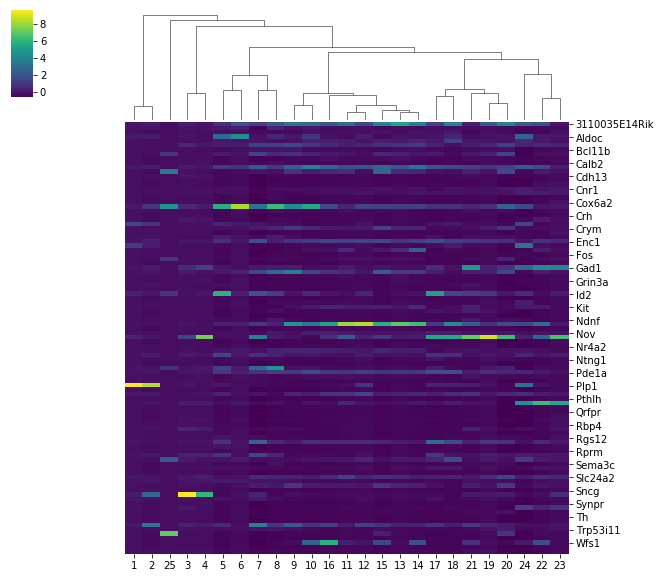

In [34]:
# Plot hierarchical clustering based on correlation
import seaborn as sns
sns.clustermap(hm_macro, row_cluster=False, metric='correlation', method='average', cmap='viridis')

In [35]:
# Annotate spots with macro cluster labels
hm_merge = np.array(hm_merge)
for macro_go in np.unique(hm_merge):
    barcodes_df.loc[barcodes_df.cluster.astype(int).isin(np.where(np.isin(hm_merge,[macro_go]))[0]),'macro_cluster'] = macro_go

In [36]:
# Remove spots without cell-type annotation (filter spots assgined to background 3135 and spots not assigned 0)
barcodes_assigned = barcodes_df[(barcodes_df.parentCell!=0) & (barcodes_df.parentCell!=3135)].copy()

In [37]:
# Annotate spots with cell-type labels from pciSeq
tqdm.pandas()
for idx, row in tqdm(barcodes_assigned.iterrows(), total=barcodes_assigned.shape[0]):
    barcodes_assigned.loc[row.name,'pciSeq_ct'] = pciSeq_cells.iloc[row.parentCell-1,:-2].idxmax()

100%|██████████| 30010/30010 [00:48<00:00, 614.98it/s]


In [38]:
# Create labels-colors dictionares for plotting
scCT=['PC.CA1.1','PC.CA1.2','PC.CA1.3','PC.Other1','PC.Other2','Eryth.1','Eryth.2','Choroid','Oligo.2','Oligo.1','Oligo.3','Oligo.4','Oligo.5','Vsmc','Endo','Astro.1','Astro.2','Astro.3','Astro.4','Astro.5','Microglia.1','Microglia.2','Calb2.Cntnap5a.Igfbp6','Calb2.Cntnap5a.Vip','Calb2.Cntnap5a.Rspo3','Calb2.Vip.Nos1','Calb2.Vip.Igfbp4','Calb2.Vip.Gpd1','Vip.Crh.C1ql1','Vip.Crh.Pcp4','Cck.Cxcl14.Vip','Cck.Cxcl14.Calb1.Tac2','Cck.Cxcl14.Calb1.Kctd12','Cck.Cxcl14.Slc17a8','Cck.Cxcl14.Calb1.Igfbp5','Cck.Cxcl14.Calb1.Tnfaip8l3','Cck.Lypd1','Cck.Lmo1.Vip.Tac2','Cck.Lmo1.Vip.Crh','Cck.Lmo1.Vip.Fam19a2','Cck.Calca','Cck.Lmo1.Npy','Cck.Sema5a','Ntng1.Chrm2','Ntng1.Rgs10','Ntng1.Synpr','Cacna2d1.Ndnf.Cxcl14','Cacna2d1.Ndnf.Rgs10','Cacna2d1.Ndnf.Npy','Cacna2d1.Lhx6.Vwa5a','Cacna2d1.Lhx6.Reln','Pvalb.C1ql1.Npy','Pvalb.C1ql1.Cpne5','Pvalb.C1ql1.Pvalb','Pvalb.Tac1.Akr1c18','Pvalb.Tac1.Syt2','Pvalb.Tac1.Sst','Pvalb.Tac1.Nr4a2','Sst.Erbb4.Th','Sst.Erbb4.Crh','Sst.Erbb4.Rgs10','Sst.Pnoc.Pvalb','Sst.Pnoc.Calb1.Pvalb','Sst.Pnoc.Calb1.Igfbp5','Sst.Npy.Mgat4c','Sst.Npy.Serpine2','Sst.Npy.Zbtb20','Sst.Npy.Cort','Sst.Nos1','Zero']
superclassCT=['PC CA1','PC CA1','PC CA1','PC other','PC other','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','Non neuron','IS1','IS1','IS1','IS3','IS3','IS3','IS2','IS2','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14+','Cck Cxcl14-','Cck Cxcl14-','Cck Cxcl14-','Cck Cxcl14-','Cck Cxcl14-','Cck Cxcl14-','Trilaminar','Radiatum retrohip','Radiatum retrohip','CGE NGF','CGE NGF','CGE NGF','MGE NGF/IVY','MGE NGF/IVY','Axo-axonic','Axo-axonic','Axo-axonic','Bistratified','Basket','Bistratified','Basket','O-Bi','O-Bi','O-Bi','O/LM','O/LM','O/LM','Hippocamposeptal','Hippocamposeptal','Hippocamposeptal','Hippocamposeptal','Sst Nos1','Uncalled']

colors = ['#3A19BD','#7657FA','#5A38DC','#FF00E6','#9A6E00','#FF0100','#1EADEA','#BCA800','#F9E52D','#DBC70F','#994C91','#5A5A5A','#3284AD','#008FCC','#01FC01','#4AAC11','#3E855B','#4EC8F4','#1F663C','#000000']
subcolors = ['#3A19BD','#7657FA','#5A38DC','#FF00E6','#9A6E00','#FF0100','#1EADEA','#BCA800','#F9E52D','#DBC70F','#994C91','#5A5A5A','#3284AD','#008FCC','#01FC01','#4AAC11','#3E855B','#4EC8F4','#1F663C','#000000']

cluster_sort = [12,13,6,17,0,2,1,10,3,18,16,4,5,7,9,8,14,15,11,19]
go_sort = [18,1,21,19,22,20,16,14,12,13,17,15,5,3,4,2,7,8,11,6,9,10]

ctname_dict = dict(zip(scCT, superclassCT))

d = dict(zip(np.unique(superclassCT), np.arange(np.unique(superclassCT).shape[0])))

subcluster_sort_dict = {'PC.CA1.1':47,
                 'PC.CA1.2':48,
                 'PC.CA1.3':49,
                 'PC.Other1':50,
                 'PC.Other2':51,
                 'Eryth.1':52,
                 'Eryth.2':53,
                 'Choroid':54,
                 'Oligo.2':55,
                 'Oligo.1':56,
                 'Oligo.3':57,
                 'Oligo.4':58,
                 'Oligo.5':59,
                 'Vsmc':60,
                 'Endo':61,
                 'Astro.1':62,
                 'Astro.2':63,
                 'Astro.3':64,
                 'Astro.4':65,
                 'Astro.5':66,
                 'Microglia.1':67,
                 'Microglia.2':68,
                 'Calb2.Cntnap5a.Igfbp6':39,
                 'Calb2.Cntnap5a.Vip':40,
                 'Calb2.Cntnap5a.Rspo3':41,
                 'Calb2.Vip.Nos1':42,
                 'Calb2.Vip.Igfbp4':43,
                 'Calb2.Vip.Gpd1':44,
                 'Vip.Crh.C1ql1':45,
                 'Vip.Crh.Pcp4':46,
                 'Cck.Cxcl14.Vip':26,
                 'Cck.Cxcl14.Calb1.Tac2':27,
                 'Cck.Cxcl14.Calb1.Kctd12':28,
                 'Cck.Cxcl14.Slc17a8':29,
                 'Cck.Cxcl14.Calb1.Igfbp5':30,
                 'Cck.Cxcl14.Calb1.Tnfaip8l3':31,
                 'Cck.Lypd1':32,
                 'Cck.Lmo1.Vip.Tac2':33,
                 'Cck.Lmo1.Vip.Crh':34,
                 'Cck.Lmo1.Vip.Fam19a2':35,
                 'Cck.Calca':36,
                 'Cck.Lmo1.Npy':37,
                 'Cck.Sema5a':38,
                 'Ntng1.Chrm2':23,
                 'Ntng1.Rgs10':24,
                 'Ntng1.Synpr':25,
                 'Cacna2d1.Ndnf.Cxcl14':20,
                 'Cacna2d1.Ndnf.Rgs10':21,
                 'Cacna2d1.Ndnf.Npy':22,
                 'Cacna2d1.Lhx6.Vwa5a':18,
                 'Cacna2d1.Lhx6.Reln':19,
                 'Pvalb.C1ql1.Npy':11,
                 'Pvalb.C1ql1.Cpne5':12,
                 'Pvalb.C1ql1.Pvalb':13,
                 'Pvalb.Tac1.Akr1c18':14,
                 'Pvalb.Tac1.Syt2':16,
                 'Pvalb.Tac1.Sst':15,
                 'Pvalb.Tac1.Nr4a2':17,
                 'Sst.Erbb4.Th':0,
                 'Sst.Erbb4.Crh':1,
                 'Sst.Erbb4.Rgs10':2,
                 'Sst.Pnoc.Pvalb':3,
                 'Sst.Pnoc.Calb1.Pvalb':4,
                 'Sst.Pnoc.Calb1.Igfbp5':5,
                 'Sst.Npy.Mgat4c':6,
                 'Sst.Npy.Serpine2':7,
                 'Sst.Npy.Zbtb20':8,
                 'Sst.Npy.Cort':9,
                 'Sst.Nos1':10,
                 'Zero':69}

color_clusters = dict(zip(np.arange(np.unique(superclassCT).shape[0]), colors))

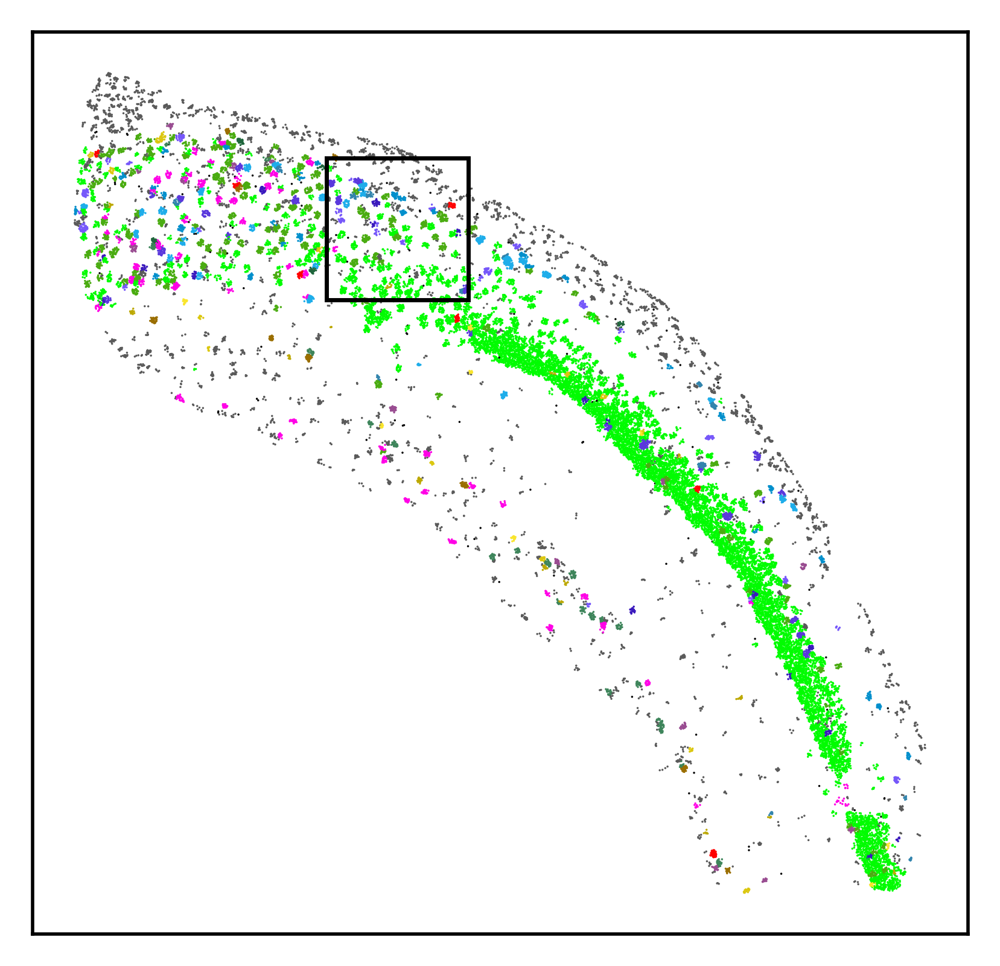

In [40]:
from matplotlib.patches import Rectangle
# Plot Cell-type map from pciSeq
fig=plt.figure(figsize=(4,4),dpi=500)
px1 = 24500
px2 = 25500
py1 = 15000
py2 = 16000

ax = fig.add_subplot(1, 1, 1)

plt.scatter(barcodes_assigned.global_X_pos, barcodes_assigned.global_Y_pos, c=[color_clusters[d[ctname_dict[ct]]] for ct in barcodes_assigned.pciSeq_ct.values],  s=1,marker='.',linewidths=0, edgecolors=None)
roi = Rectangle((px1,py1),1000,1000,linewidth=1,edgecolor='black',facecolor='none')
plt.xticks([])
plt.yticks([])
ax.add_patch(roi);
plt.axis('scaled');
# plt.savefig('../figures/Fig2b.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

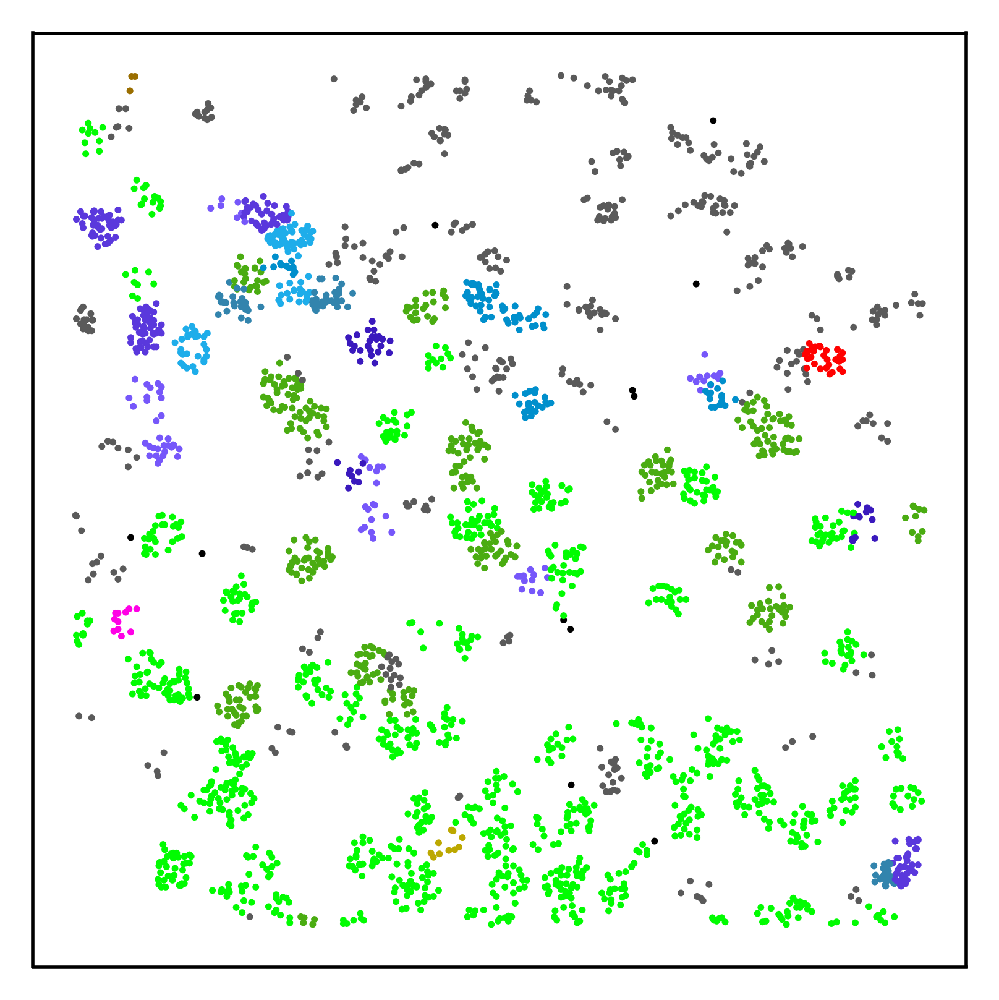

In [41]:
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_assigned[(barcodes_assigned.global_X_pos>px1) & (barcodes_assigned.global_X_pos<px2) & (barcodes_assigned.global_Y_pos>py1) & (barcodes_assigned.global_Y_pos<py2)] 
plt.scatter(cut_out_df.global_X_pos, cut_out_df.global_Y_pos, c=[color_clusters[d[ctname_dict[ct]]] for ct in cut_out_df.pciSeq_ct.values], s=10,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig2h.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

In [42]:
# Generate heatmap of expression profiles of the corresponding spage2vec and cell-type clusters
ct_dict = dict(zip(pciSeq_ct.values.T[0], np.arange(pciSeq_ct.shape[0])))
macro_go_clusters = np.unique(hm_merge)

dots_in_cells = np.zeros((macro_go_clusters.shape[0], pciSeq_ct.shape[0]))

# Compute number of dots of each cell types with a given spage2vec cluster label
for go_idx, go in tqdm(enumerate(macro_go_clusters)):
    barcodes_df_tmp = barcodes_assigned.loc[barcodes_assigned.macro_cluster==go,'global_Y_pos':'global_X_pos'].values.astype(int)
    
    ct, ct_counts = np.unique(barcodes_assigned[barcodes_assigned.macro_cluster==go].pciSeq_ct, return_counts=True)
    
    ct_idx = [ct_dict[x] for x in ct]
    dots_in_cells[go_idx, ct_idx] = ct_counts

# Create dataframes
dots_in_cells = pd.DataFrame(dots_in_cells, columns=pciSeq_ct.values.T[0], index=macro_go_clusters)

25it [00:00, 425.03it/s]


In [43]:
# Normalize dataframe
dots_in_cells = dots_in_cells.divide(dots_in_cells.sum(axis=0), axis=1) * dots_in_cells.shape[1] #Corrected for the total per cell
dots_in_cells = dots_in_cells.divide(dots_in_cells.sum(axis=1), axis=0) * dots_in_cells.shape[0] #Corrected for total molecules per gene

#Replace NA and Nan with zero:
dots_in_cells = dots_in_cells.fillna(0)

In [44]:
subcluster_sort = dots_in_cells.columns.values[np.argsort([subcluster_sort_dict[x] for x in dots_in_cells.columns.values])]
dots_in_cells = dots_in_cells.reindex(subcluster_sort, axis=1)
reorder_rows = dict(zip(subcluster_sort,np.arange(dots_in_cells.shape[1])))
go_sort = dots_in_cells.idxmax(axis=1).map(reorder_rows).argsort().values+1

In [45]:
dots_in_cells = dots_in_cells.reindex(go_sort)

df used for plot: dots_in_cells
Order of clusters: [12, 13, 6, 17, 0, 2, 1, 10, 3, 18, 16, 4, 5, 7, 9, 8, 14, 15, 11, 19]


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/matplotlib/axes/_base.py:3221: MatplotlibDeprecationWarning: 
The `xmax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `right` instead.
  alternative='`right`', obj_type='argument')


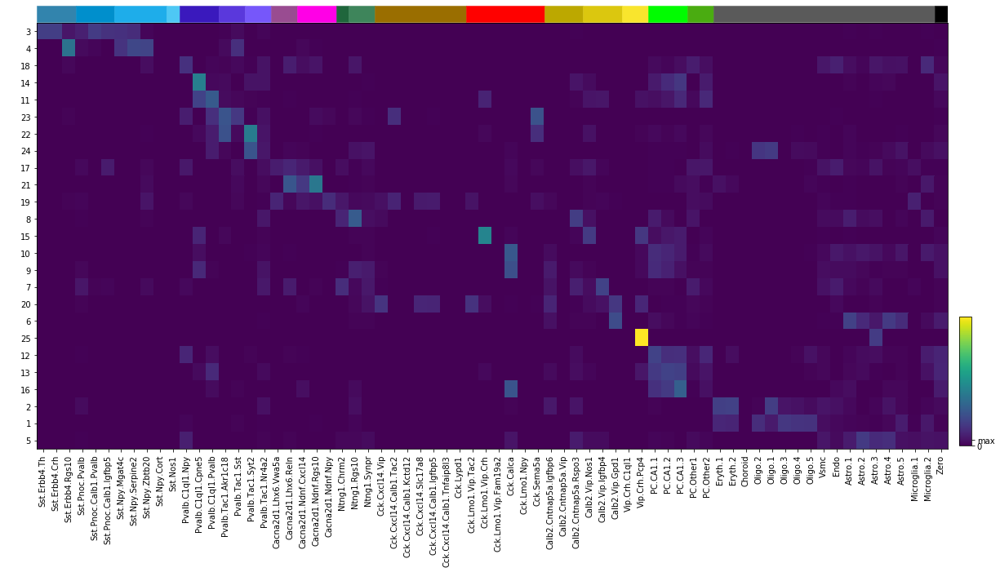

In [46]:
# Plot heatmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from collections import Counter
heat_map(dots_in_cells,[d[ctname_dict[x]] for x in dots_in_cells.columns.values], cluster_colors=color_clusters, sort = cluster_sort, save=True, name='Fig2c', fontsz=10)

## 3D UMAP Visualization (left)

In [47]:
# Load embedding for 4_1 left
X2 = np.load('../results/ISS_Qian_et_al/embedding_ISS_left.npy')
X2.shape

(40320, 50)

In [48]:
# Load embedding for 4_1 right
X1 = np.load('../results/ISS_Qian_et_al/embedding_ISS_right.npy')

In [49]:
# Concatenate embeddings
X = np.vstack([X2,X1])

26.0


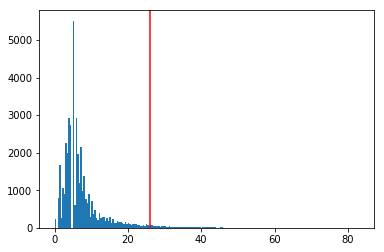

In [50]:
# Load 4_1 left spots
barcodes_df_left = pd.read_csv("../data/ISS_Qian_et_al/left-spots.csv", sep = ",", names=['Gene', 'global_Y_pos', 'global_X_pos', 'Q', 'parentCell'],header=0)   
d_th = plotNeighbor(barcodes_df_left)

In [51]:
# Build spatial gene expression graph
G, barcodes_df_left = buildGraph(barcodes_df_left, d_th)

100%|██████████| 2514/2514 [00:00<00:00, 622460.46it/s]


In [52]:
barcodes_df_left.shape

(40320, 5)

In [53]:
import umap
reducer = umap.UMAP(
    n_neighbors=10,
    n_components=3,
    n_epochs=500,
    init='spectral',
    min_dist=0.1,
    spread=1,
    random_state=42
)

embedding = reducer.fit_transform(X)

/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


In [54]:
Y_umap = embedding
Y_umap -= np.min(Y_umap, axis=0)
Y_umap /= np.max(Y_umap, axis=0)

In [55]:
# Annotate rgb color-space spot locations
from matplotlib.colors import to_hex
from tqdm.notebook import tqdm

Y_umap_tmp = Y_umap[X2.shape[0]:]
barcodes_df['colorspace'] = [to_hex(Y_umap_tmp[x,:], keep_alpha=False) for x in tqdm(range(Y_umap_tmp.shape[0]))]
Y_umap_tmp = Y_umap[:X2.shape[0]]
barcodes_df_left['colorspace'] = [to_hex(Y_umap_tmp[x,:], keep_alpha=False) for x in tqdm(range(Y_umap_tmp.shape[0]))]

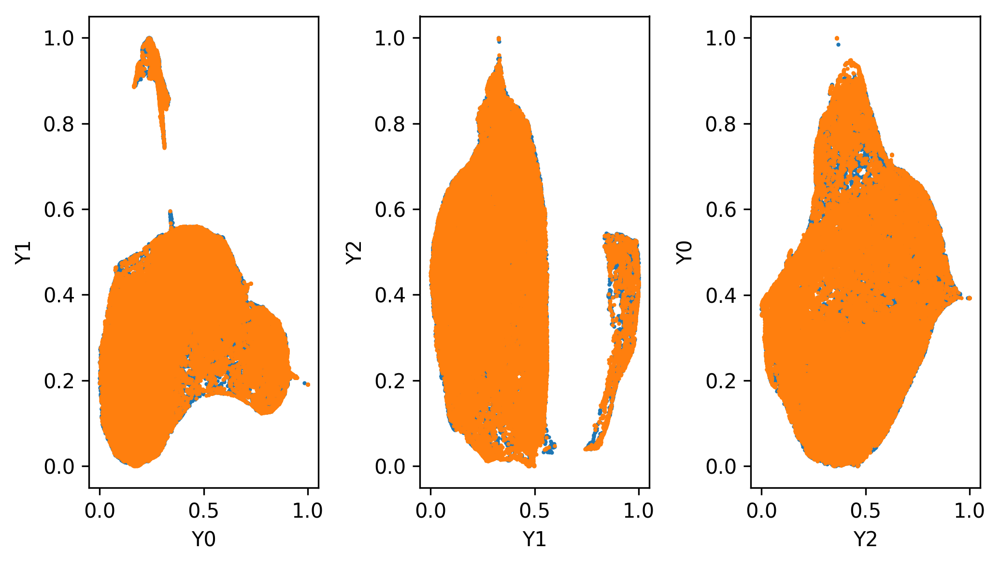

In [58]:
# Overlap of right and left embedding
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(7,4),dpi=300)
cycled = [0,1,2,0]
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(Y_umap[:X2.shape[0],cycled[i]], Y_umap[:X2.shape[0],cycled[i+1]],s=1)
    plt.scatter(Y_umap[X2.shape[0]:,cycled[i]], Y_umap[X2.shape[0]:,cycled[i+1]],s=1)
    plt.xlabel("Y"+str(cycled[i]))
    plt.ylabel("Y"+str(cycled[i+1]))
plt.tight_layout()

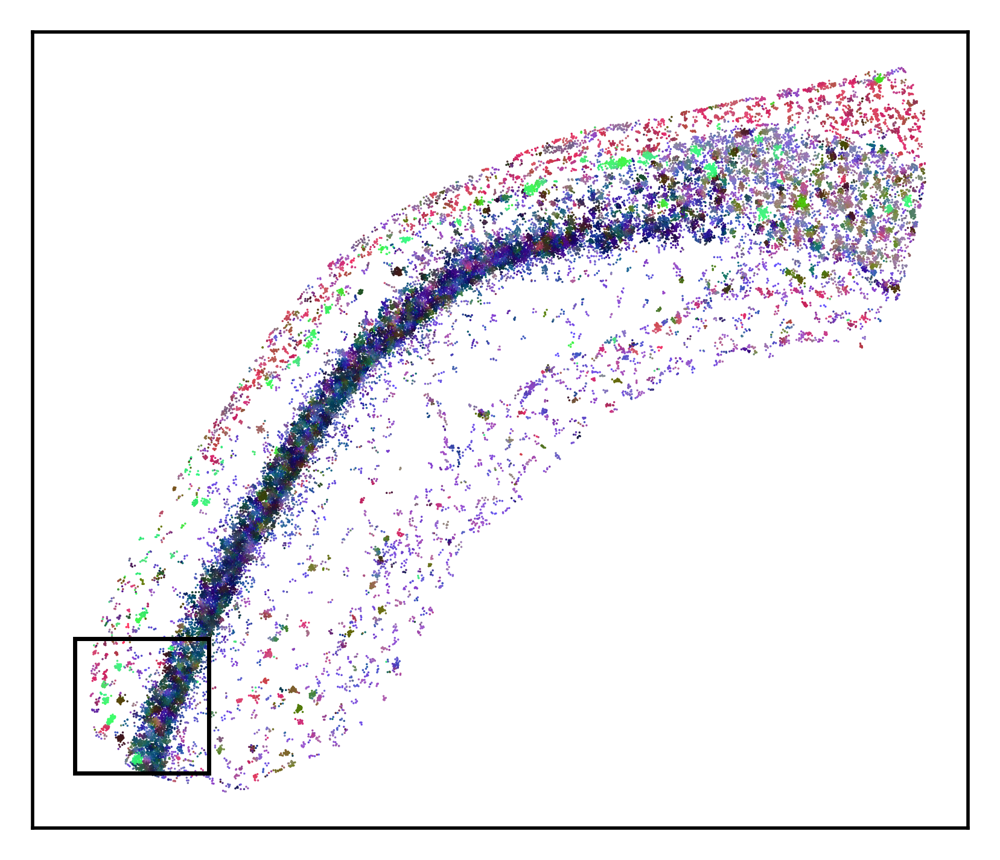

In [59]:
from matplotlib.patches import Rectangle
fig=plt.figure(figsize=(4,4),dpi=500)
ax = fig.add_subplot(1, 1, 1)

px1 = 4700
px2 = 5700
py1 = 12000
py2 = 13000

plt.scatter(barcodes_df_left.global_X_pos, barcodes_df_left.global_Y_pos, c=Y_umap[:X2.shape[0]], s=1,marker='.',linewidths=0, edgecolors=None)
# Draw cut-out
roi = Rectangle((px1,py1),1000,1000,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi);

plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig2d.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

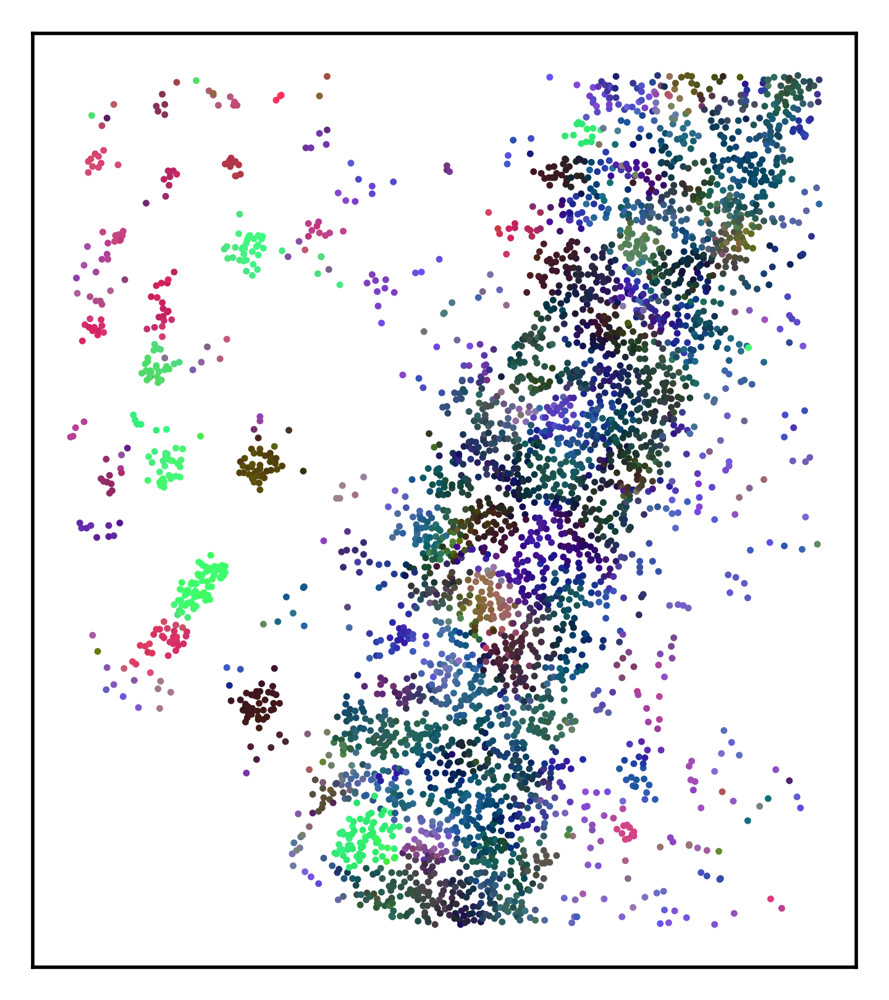

In [60]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_df_left[(barcodes_df_left.global_X_pos>px1) & (barcodes_df_left.global_X_pos<px2) & (barcodes_df_left.global_Y_pos>py1) & (barcodes_df_left.global_Y_pos<py2)] 
Y_tmp = Y_umap[:X2.shape[0]]
Y_tmp = Y_tmp[(barcodes_df_left.global_X_pos>px1) & (barcodes_df_left.global_X_pos<px2) & (barcodes_df_left.global_Y_pos>py1) & (barcodes_df_left.global_Y_pos<py2)]
plt.scatter(cut_out_df.global_X_pos, cut_out_df.global_Y_pos, c=Y_tmp, s=10,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig2i.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

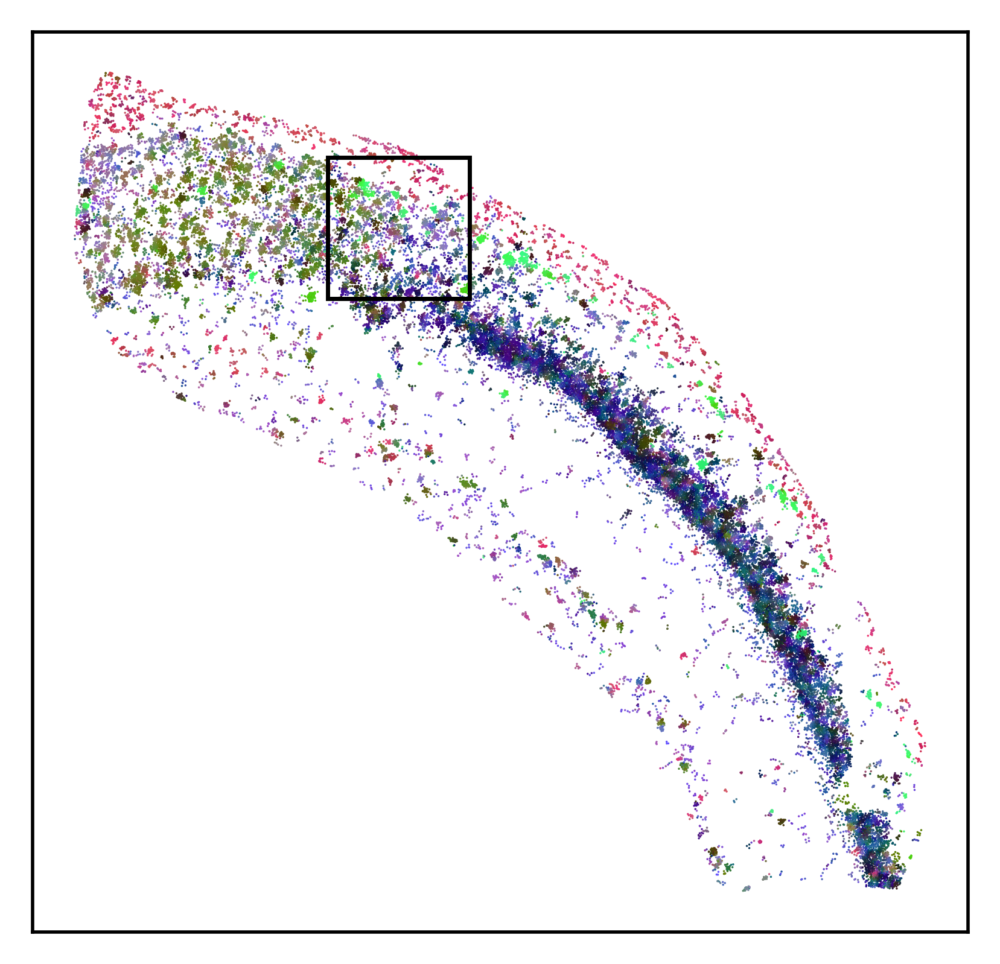

In [62]:
from matplotlib.patches import Rectangle

px1 = 24500
px2 = 25500
py1 = 15000
py2 = 16000

fig=plt.figure(figsize=(4,4),dpi=500)
ax = fig.add_subplot(1, 1, 1)
plt.scatter(barcodes_df.global_X_pos, barcodes_df.global_Y_pos, c=Y_umap[X2.shape[0]:], s=1,marker='.',linewidths=0, edgecolors=None)
# Draw cut-out
roi = Rectangle((px1,py1),1000,1000,linewidth=1,edgecolor='black',facecolor='none')
ax.add_patch(roi);

plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig2a.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

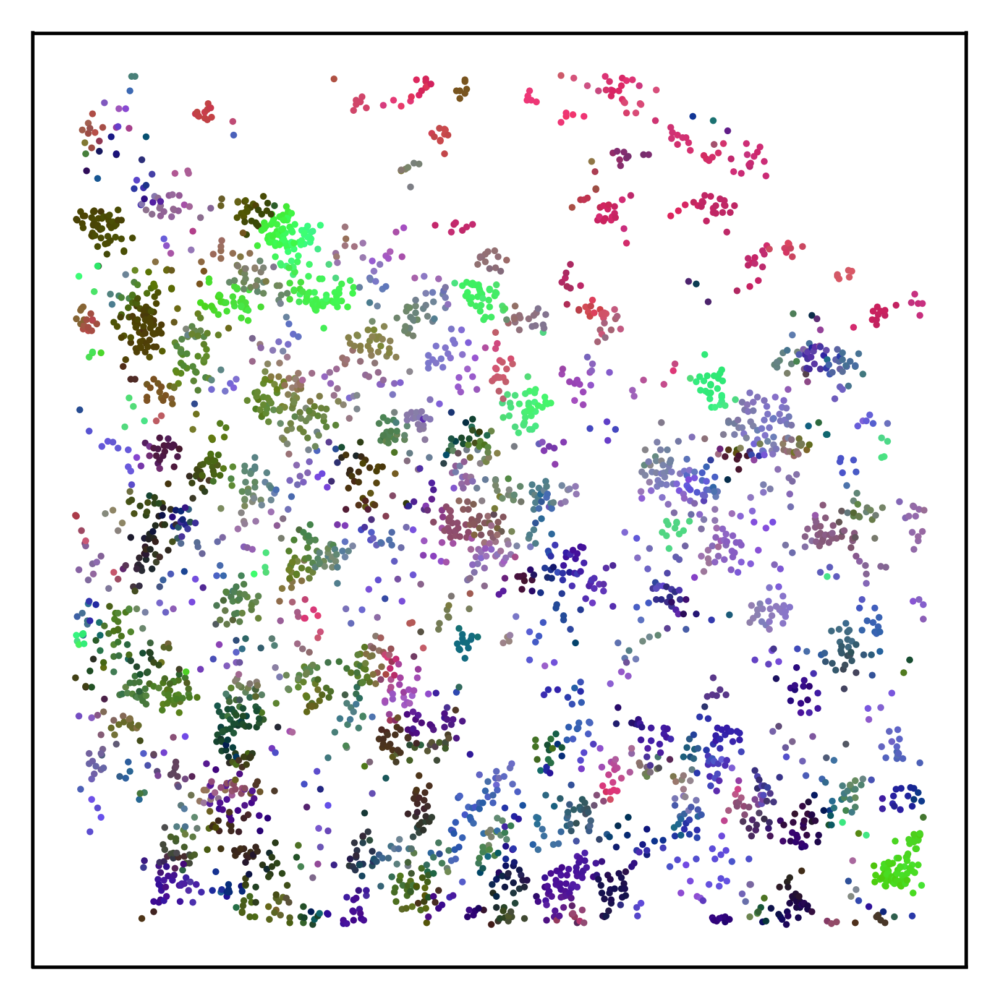

In [63]:
# Plot cut-out
fig=plt.figure(figsize=(4,4),dpi=500)

cut_out_df = barcodes_df[(barcodes_df.global_X_pos>px1) & (barcodes_df.global_X_pos<px2) & (barcodes_df.global_Y_pos>py1) & (barcodes_df.global_Y_pos<py2)] 
Y_tmp = Y_umap[X2.shape[0]:]
Y_tmp = Y_tmp[(barcodes_df.global_X_pos>px1) & (barcodes_df.global_X_pos<px2) & (barcodes_df.global_Y_pos>py1) & (barcodes_df.global_Y_pos<py2)]
plt.scatter(cut_out_df.global_X_pos, cut_out_df.global_Y_pos, c=Y_tmp, s=10,marker='.',linewidths=0, edgecolors=None)
plt.xticks([])
plt.yticks([]);
plt.axis('scaled');
# plt.savefig('../figures/Fig2g.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

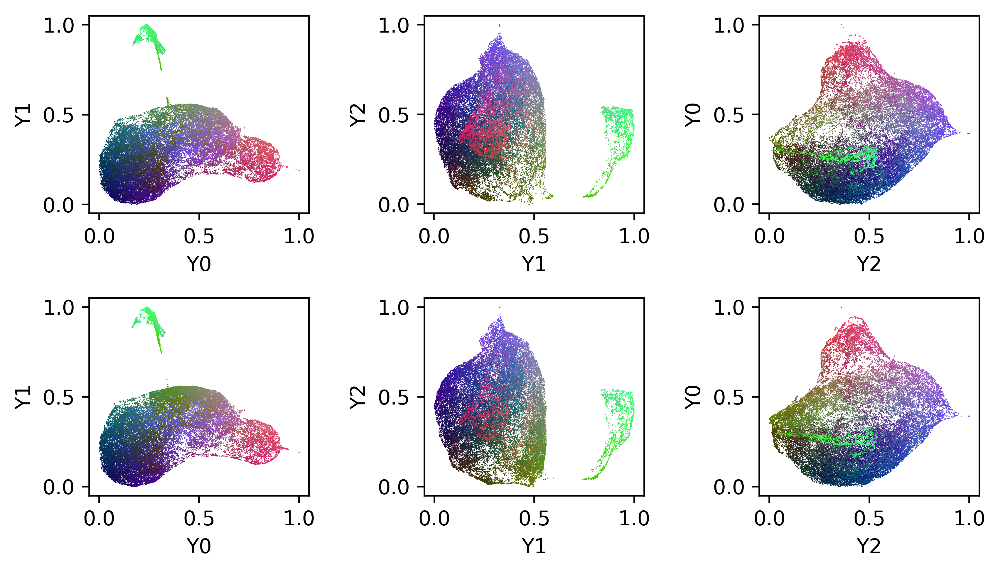

In [64]:
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(7,4),dpi=500)
cycled = [0,1,2,0]
for i in range(3):
    plt.subplot(2,3,i+1)
    plt.scatter(Y_umap[:X2.shape[0],cycled[i]], Y_umap[:X2.shape[0],cycled[i+1]], c=Y_umap[:X2.shape[0]],s=1,marker='.',linewidths=0, edgecolors=None)
    plt.xlabel("Y"+str(cycled[i]))
    plt.ylabel("Y"+str(cycled[i+1]))
plt.tight_layout()
for i in range(3):
    plt.subplot(2,3,i+3+1)
    plt.scatter(Y_umap[X2.shape[0]:,cycled[i]], Y_umap[X2.shape[0]:,cycled[i+1]], c=Y_umap[X2.shape[0]:], s=1,marker='.',linewidths=0, edgecolors=None)
    plt.xlabel("Y"+str(cycled[i]))
    plt.ylabel("Y"+str(cycled[i+1]))
plt.tight_layout()
# plt.savefig('../figures/Fig2f.png', dpi=500, bbox_inches='tight', pad_inches=0.0)

## Clustering with Scanpy (left)

In [67]:
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = '../results/ISS_Qian_et_al/ISS_4_1_left.h5'  # the file that will store the analysis results

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.24.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [68]:
adata = sc.AnnData(X=X2)

In [93]:
# Compute the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=15)

computing neighbors
    using data matrix X directly


/home/gabpa510/miniconda3/envs/cuUMAP/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "miniconda3/envs/cuUMAP/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:07)


In [94]:
sc.tl.leiden(adata, random_state = 42)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:30)


In [95]:
adata.obs['Gene'] = barcodes_df_left.Gene.values

In [96]:
# save clustering data
adata.write(results_file)

... storing 'Gene' as categorical


In [69]:
# Load clustering data
adata = sc.read(results_file)

In [70]:
# Extract leiden clusters
col_cluster = adata.obs['leiden'].values.astype(int)
col = np.unique(col_cluster)

In [71]:
# Add leiden clusters to spots dataframe
barcodes_df_left['cluster'] = adata.obs['leiden'].values
go_clusters = np.unique(adata.obs['leiden'].values)
barcodes_df_left.head()

,Gene,global_Y_pos,global_X_pos,Q,parentCell,colorspace,cluster
0,Plp1,12574,4818,0.988940,2,#b54399,10
1,Plp1,12575,4821,0.986681,2,#ba4093,10
2,Cryab,12585,4824,0.966363,2,#bb4093,10
3,Aldoc,12761,4825,0.988756,3,#8f3fa9,10
4,Id2,12743,4826,0.982973,3,#ae6197,10


In [72]:
# Create cluster gene expression matrix
hm_left = barcodes_df_left.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm_left.shape

(97, 29)

#### Merge cluster based on correlation distance

In [73]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm_left = pd.DataFrame(scaler.fit_transform(hm_left.values), columns=hm_left.columns, index=hm_left.index)
hm_left.head()

cluster,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
Gene,,,,,,,,,,,,,,,,,,,,,
3110035E14Rik,3.928525,2.565351,4.898529,4.752390,1.904084,2.995755,0.792915,0.318105,2.279096,2.576198,...,1.893506,2.196068,-0.062688,2.103163,7.374411,6.879355,1.691238,4.973690,-0.007197,-0.058586
6330403K07Rik,-0.201788,-0.212756,-0.246298,-0.215742,-0.172440,0.340162,0.454268,-0.082825,-0.070843,-0.170912,...,-0.134979,-0.049531,-0.108294,0.196557,0.782430,-0.310461,0.122989,-0.083416,-0.222011,-0.208136
Adgrl2,-0.186603,-0.118263,-0.167450,-0.236020,-0.221491,-0.345866,-0.242947,-0.175347,-0.320079,-0.298685,...,-0.288652,-0.362871,-0.138697,-0.049456,-0.272287,-0.192595,-0.325083,0.028964,-0.222011,-0.208136
Aldoc,-0.232158,-0.023769,0.147941,-0.296855,-0.237842,0.738501,4.717239,0.241003,0.712470,-0.107026,...,-0.350121,-0.101755,0.028523,0.258061,1.529521,-0.192595,0.571060,4.748929,-0.007197,0.090963
Arpp21,0.117097,0.618786,0.266213,-0.094074,0.105520,-0.102437,0.075780,-0.206188,0.000367,-0.330628,...,-0.073510,-0.362871,-0.138697,0.135054,0.342964,-0.074729,0.235006,0.928005,-0.222011,-0.133361


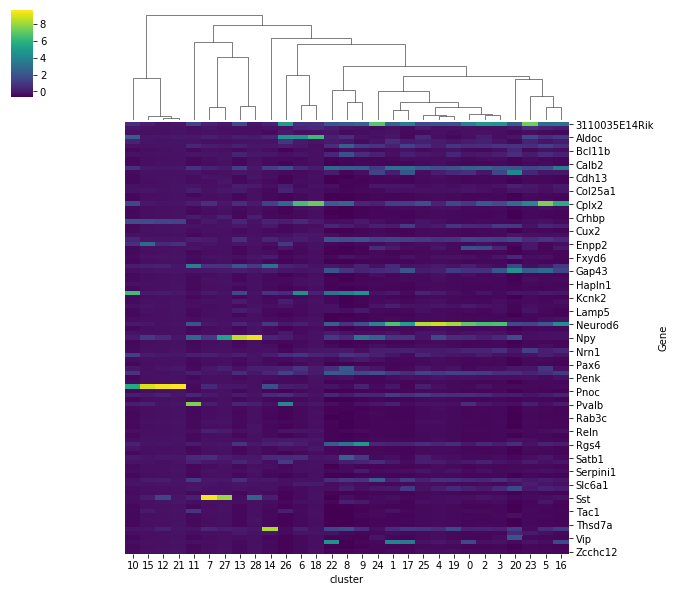

In [74]:
# Plot hierarchical clustering based on correlation
import seaborn as sns
sns.clustermap(hm_left, row_cluster=False, metric='correlation', method='average', cmap='viridis')

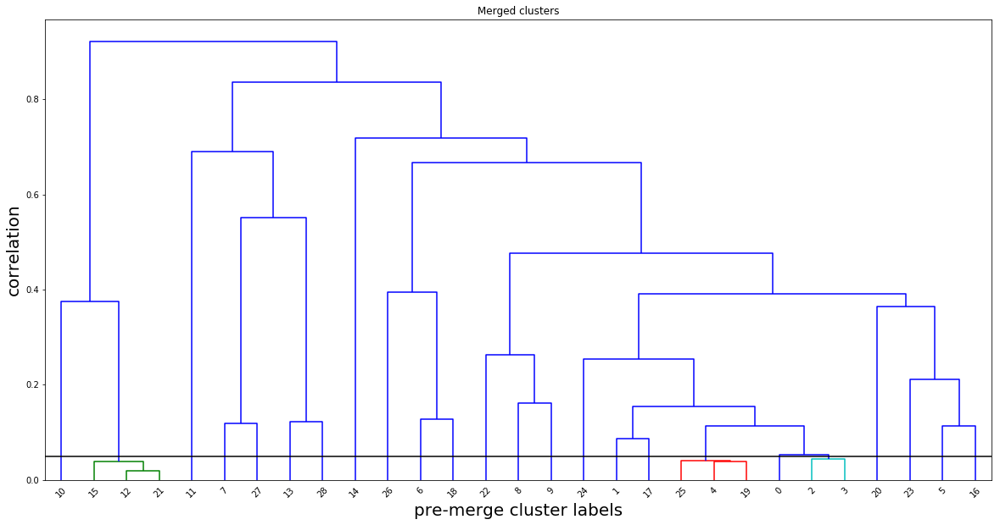

In [75]:
# Merge high correlated clusters
import scipy
hm_merge_left = post_merge(hm_left, hm_left.columns, 0.05, linkage_metric='correlation', linkage_method='average')

In [76]:
# Macroclusters
np.unique(hm_merge_left)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24], dtype=int32)

In [77]:
# Create cluster gene expression matrix
hm_left = barcodes_df_left.groupby(['Gene','cluster']).size().unstack(fill_value=0)
hm_left.shape

(97, 29)

In [78]:
hm_left = hm_left.append(pd.DataFrame(np.zeros((tagList_df[~tagList_df.Gene.isin(hm_left.index.values)].values.reshape(-1).shape[0],hm_left.shape[1])), index=tagList_df[~tagList_df.Gene.isin(hm_left.index.values)].values.reshape(-1), columns=hm_left.columns)).sort_index()

In [79]:
hm_macro_left = pd.DataFrame(np.zeros((hm_left.shape[0], np.unique(hm_merge_left).shape[0])), index=hm_left.index, columns=np.unique(hm_merge_left))

for d in np.unique(hm_merge_left):
    # merge clusters by averaging the expression
    hm_macro_left.loc[:,d] = hm_left.iloc[:,np.where(np.array(hm_merge_left)==d)[0]].sum(axis=1)

In [80]:
# Z-score normalization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
hm_macro_left = pd.DataFrame(scaler.fit_transform(hm_macro_left.values), columns=hm_macro_left.columns, index=hm_macro_left.index)
hm_macro_left.head()

,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,24
3110035E14Rik,0.001736,0.807868,0.326598,-0.002739,1.709067,-0.054915,1.394098,0.807660,0.819624,5.021195,...,3.793741,1.913351,4.929806,3.969972,6.945796,3.029578,3.163287,7.446022,2.222603,0.331714
6330403K07Rik,-0.129704,0.062084,-0.078151,-0.219647,-0.185042,-0.205933,-0.266519,0.466044,0.627570,-0.073185,...,-0.301932,-0.109271,-0.227096,-0.194393,-0.304340,0.351847,0.204071,0.797388,-0.037158,-0.081884
Adgrl2,-0.185313,-0.195083,-0.171554,-0.219647,-0.213312,-0.205933,-0.213801,-0.237284,-0.217467,0.040023,...,-0.337859,-0.255705,-0.196521,-0.179083,-0.185485,-0.339901,-0.380465,-0.266393,-0.352474,-0.302470
Aldoc,-0.013430,2.402304,0.248762,-0.002739,0.210742,0.096102,-0.002929,4.766391,6.408396,4.794778,...,-0.337859,-0.136727,-0.064031,-0.225013,-0.185485,0.753506,1.007809,1.550900,-0.089711,0.414434
Arpp21,-0.114538,0.370684,-0.202689,-0.219647,-0.156772,-0.130424,-0.055647,0.084237,-0.063824,0.945691,...,0.129192,0.082924,0.099033,0.127121,-0.066631,-0.094442,0.131004,0.354146,-0.352474,-0.109457


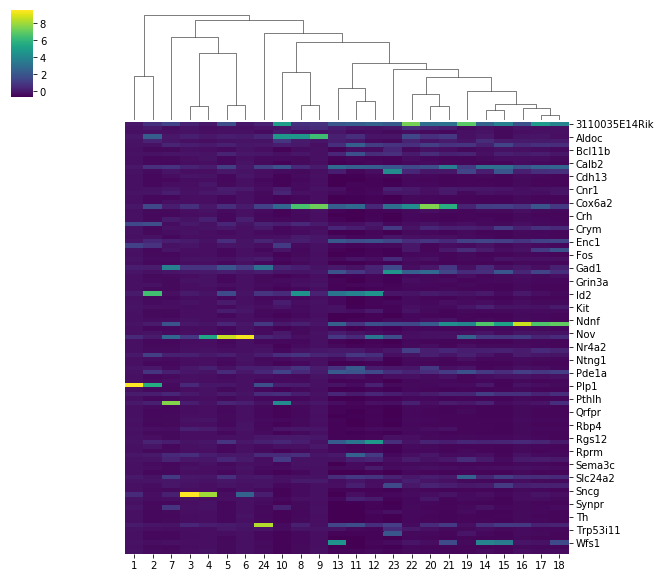

In [81]:
# Plot hierarchical clustering based on correlation
import seaborn as sns
sns.clustermap(hm_macro_left, row_cluster=False, metric='correlation', method='average', cmap='viridis')